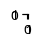

In [1]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 150

sns.set_style('darkgrid')
import os,sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import warnings
warnings.filterwarnings("ignore")
import glob
from tqdm.auto import tqdm
from datetime import datetime as dt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import LabelEncoder
import torch
from torch import nn
from torch.nn import functional as F
mpl.rcParams['figure.dpi'] = 180
# Load models together
%load_ext autoreload
%autoreload 2
    
from src.torch_utils import load_model_full
from src.utils import get_class_initcode_keys
from torch.utils.data import SequentialSampler
from src.datasets import *
from src.models import *
from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, add_median_labels, get_palette
from src.sim_utils import make_dist_matrix
from src.torch_utils import save_checkpoint, load_checkpoint
from src.train_eval import predict_model, train_eval_loops
from src.models import FullTCRVAE, TwoStageVAECLF
from src.conv_models import CNNVAE, TwoStageCNNVAECLF
from src.metrics import reconstruction_accuracy, compute_cosine_distance
from src.cluster_utils import *
from src.networkx_utils import *

In [2]:
import numpy as np
from src.metrics import custom_silhouette_score
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

def weighted_silhouette_score(input_matrix, labels, metric='euclidean'):
    # Step 1: Compute the silhouette score for each sample
    all_scores = silhouette_samples(input_matrix, labels, metric=metric)

    # Step 2: Identify unique clusters and their sizes
    unique_labels, cluster_sizes = np.unique(labels, return_counts=True)

    # Step 3: Compute the weight for each cluster using log2(size) + 1
    cluster_weights = {label: size for label, size in zip(unique_labels, cluster_sizes)}

    # Step 4: Apply weights to each sample's silhouette score based on its cluster
    weighted_scores = np.array([all_scores[i] * cluster_weights[labels[i]] for i in range(len(labels))])

    # Step 5: Normalize the weighted scores by the total sum of weights
    total_weight = np.sum([cluster_weights[labels[i]] for i in range(len(labels))])

    # Step 6: Return the weighted silhouette score
    return np.sum(weighted_scores) / total_weight
# Step 1: Create a synthetic dataset with well-separated clusters
n_samples = 645
centers = [[1, 1], [5, 5], [9, 9], [1, 9], [9, 1]]  # Well-separated centers
cluster_std = [0.5, 0.7, 0.5, 0.6, 0.7]  # Controlled standard deviations (tight clusters)

X, labels = make_blobs(n_samples=n_samples, centers=centers, cluster_std=cluster_std, random_state=42)
print(silhouette_score(X, labels, metric='cosine'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='micro'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='macro'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='size_weighted'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='size_log2'))
print(weighted_silhouette_score(X, labels, metric='cosine'))



0.2641186215618113
0.2641
0.2641
0.2641
0.2641
0.2641186215618113


# init

In [3]:
import csv
def get_metadata(filename):
    # Initialize a dictionary to hold the header information
    metadatares = {'filename':os.path.basename(filename)}
    metadatares['relpath']=filename
    # Read the CSV file
    with open(filename, mode='r') as file:
        reader = csv.reader(file)
        # Read the first line which contains the metadata
        metadata_line = next(reader)[0]
        # Convert the metadata line to a dictionary
        metadata = eval(metadata_line)
    metadatares.update(metadata)
    return metadatares
    
def read_ots_data(filename):
    metadata = get_metadata(filename)
    df = pd.read_csv(filename, skiprows=1)
    df = df[[c for c in df.columns if ('aa' in c.lower() and 'cdr' in c.lower()) or 'call' in c.lower()]]
    df.columns = [x.replace('cdr','').replace('_aa_','').replace('beta','B').replace('alpha','A')[::-1] if 'cdr' in x else x for x in df.columns]
    df.columns = df.columns.str.replace('_call','')
    df['Link']=metadata['Link']
    df['Disease']=metadata['Disease']
    df['CancerType']=metadata['CancerType']
    df['Source']=metadata['TSource']
    df['Subject']=metadata['Subject']
    return df, metadata


def plot_prune_heatmap(values, threshold, title, 
                       filename=None, outdir='../output/240618_NestedKCV_CNNVAE/notebook_figs/',
                       sorted_dm=None,
                       cmap='vlag', color='g', addline=True):
    # prune and plot the heatmap
    f,ax = plt.subplots(1,2, figsize=(16,16), width_ratios=(16.5/17, 0.5/17))
    ax = ax.ravel()
    ax, cbar_ax = ax[0], ax[1]
    pruned = values.copy()
    mask = (pruned<=threshold).astype(int)
    pruned = pruned * mask
    sns.heatmap(pruned, ax=ax, square=True, vmin=0, vmax=values.max(), cbar_ax=cbar_ax, cmap=cmap)
    # Set up custom tickmarks if available
    if sorted_dm is not None:
        pepmap = sorted_dm.groupby('peptide').agg(count=('raw_index','count'))
        pepmap['idx']=pepmap['count'].cumsum()
        pepmap['tick']=pepmap['idx']-pepmap['count'].iloc[0]+3
        tickmarks = pepmap['tick'].to_dict() 
        idxs = pepmap['idx'].to_dict()
        ax.set_xticks(list(tickmarks.values()))
        ax.set_yticks(list(tickmarks.values()))
        ax.set_xticklabels(list(tickmarks.keys()), ha='center', fontweight='semibold', fontsize=15)
        ax.set_yticklabels(list(tickmarks.keys()), va='center', fontweight='semibold', fontsize=15)
    if addline and sorted_dm is not None:
        for k,v in idxs.items():
            ax.axhline(v, ls='--', lw=.9, c=color)
            ax.axvline(v, ls='--', lw=.9, c=color)
    # Rotate the tick labels for better readability (optional)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    ax.set_title(title, fontweight='semibold', fontsize=17)
    f.tight_layout()
    if filename is not None:
        f.savefig(f'{outdir}{filename}.png', dpi=150, bbox_inches='tight')
    plt.close()
    del f, ax

def do_all(filename, model, noplot=False, unique=False, outdir='../output/240820_HumanRepertoires/'):
    df, metadata = read_ots_data(filename)
    df['tcr'] = df[['A1','A2','A3','B1','B2','B3']].sum(axis=1)
    if unique:
        df.drop_duplicates(subset=['tcr'], inplace=True)
    metadata['n_seq'] = len(df)
    metadata['n_unique'] = len(df['tcr'].unique())
    pd.DataFrame(metadata, index=[0]).to_csv(f"{outdir}metadata/{metadata['Run']}_metadata.txt", index=False)
    if noplot:
        return 0
    else:
            
        if len(glob.glob(f'{outdir}heatmaps/*{metadata["Run"]}*'))>0:
            return 0
    
        latent_df = get_latent_df(model, df)
        latent_df['index_col'] = [f'seq_{i:04}' for i in range(len(latent_df))]
        _, values_array, _, _, _, _ = get_distances_labels_from_latent(latent_df, 
                                                                       label_col='Disease', 
                                                                       index_col='index_col',
                                                                       rest_cols=['Disease','CancerType','Source'],
                                                                       low_memory=True)
        
        latent_df['tcr'] = latent_df[['A1','A2','A3','B1','B2','B3']].sum(axis=1)
        n_seq=len(latent_df)
        n_unique=len(latent_df['tcr'].unique())
        plot_prune_heatmap(values_array, threshold=10, title=f"{metadata['Run']}, n_seq={n_seq}, n_unique={n_unique}", 
                           filename=f'{metadata["Run"]}_n-{n_seq}_unique-{n_unique}',
                           outdir=f'{outdir}heatmaps/', addline=False, sorted_dm=None)
        print(metadata['Run'], '\t', n_seq, '\t', n_unique)
        del latent_df
    # latent_df.groupby(['tcr']).agg(count=('B1','count')).sort_values('count',ascending=False)

In [185]:
# Clean / augment / cut wrapper / clean dm
def get_dist(row, dm):
    # print(row.name)
    wtf=dm.loc[row.name]
    label = wtf['peptide']
    idx = wtf['raw_index']
    # intra part
    indices = dm.query('peptide==@label and raw_index!=@idx').index
    intra_values = row[indices].values
    intra_mean_val = intra_values.mean()
    intra_max_val = intra_values.max()
    intra_med_val = np.median(intra_values)
    # inter part
    indices = dm.query('peptide!=@label and raw_index!=@idx').index
    inter_values = row[indices].values
    inter_mean_val = inter_values.mean()
    inter_max_val = inter_values.max()
    inter_med_val = np.median(inter_values)
    return intra_mean_val, intra_max_val, intra_med_val, inter_mean_val, inter_max_val, inter_med_val

def clean_dm(dm, intra=0.9, inter=0.9):
    dm[['intra_mean_val', 'intra_max_val', 'intra_med_val', 'inter_mean_val', 'inter_max_val', 'inter_med_val']] = dm.apply(lambda x: get_dist(x, dm), result_type='expand', axis=1)
    dm['mean_flag'] = dm.apply(lambda x: x['intra_mean_val']>x['inter_mean_val'], axis=1)
    dm['max_flag'] = dm.apply(lambda x: x['intra_max_val']>x['inter_max_val'], axis=1)
    dm['med_flag'] = dm.apply(lambda x: x['intra_med_val']>x['inter_med_val'], axis=1)
    dm['intra_flag'] = dm['intra_mean_val'].apply(lambda x: x>intra)
    dm['inter_flag'] = dm['inter_mean_val'].apply(lambda x: x<=inter)
    cleaned = dm.query('not (mean_flag or max_flag or med_flag or intra_flag or inter_flag)')
    return cleaned[list(cleaned.index)+['peptide','raw_index','partition','binder']]

from src.networkx_utils import iterative_SIrank_cut_logsize, iterative_topn_cut_logsize
from functools import partial 
def cut_wrapper(dist_array, tree, initial_cut_threshold=1, initial_cut_method='top', cut_threshold=1, cut_method='top', 
                which='edge', distance_weighted=True, scale_aggregation='max', score_threshold=1, verbose=0,
                cut='rank', silhouette_aggregation='micro'):

    if cut=='rank':
        fc=partial(iterative_SIrank_cut_logsize, which=which,
                   initial_cut_threshold=initial_cut_threshold, initial_cut_method=initial_cut_method, cut_threshold=cut_threshold, cut_method=cut_method,
                   scale_aggregation=scale_aggregation, silhouette_aggregation=silhouette_aggregation)
                   
    elif cut=='topn':
        fc=partial(iterative_topn_cut_logsize, distance_weighted=distance_weighted, silhouette_aggregation=silhouette_aggregation,
                   initial_cut_threshold=initial_cut_threshold, initial_cut_method=initial_cut_method, cut_threshold=cut_threshold,
                   which=which, verbose=verbose, score_threshold=score_threshold)
    else :#=='size':
        raise ValueError
    best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, all_cluster_sizes, clusters_above = fc(dist_array, tree)
    results_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters, [len(x) for x in clusters_above]]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'n_above']).assign(silhouette_aggregate=silhouette_aggregation)
    return results_df, best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, all_cluster_sizes, clusters_above


def get_edges_dist(graph, key='weight'):
    edgelist=graph.edges(data=True)
    return [x[2][key] for x in edgelist]
    
def prune_tree_edges(mst, key='weight', percentile=50, epsilon=None):
    tree = mst.copy()
    edges=mst.edges(data=True)
    if epsilon is None:
        epsilon = np.percentile([x[2][key] for x in edges], percentile)
    print(epsilon)
    edges_to_prune=[(x[0], x[1]) for x in edges if x[2][key]>=epsilon]
    tree.remove_edges_from(edges_to_prune)
    return tree
    

def augment_tree_edges(mst, dist_array, key='weight', percentile=50, epsilon=None):
    tree = mst.copy()
    # assert percentile>0 and percentile<=100, f'percentile must be in ]0,100]%'
    if epsilon is None:
        edges = [x[2][key] for x in mst.edges(data=True)]
        epsilon = np.percentile(edges, percentile)
    print(epsilon)
    pairs = np.column_stack(np.where((dist_array <= epsilon) & (dist_array > 0)))
    for i,j in pairs:
        if not tree.has_edge(i,j) :
            tree.add_edge(i,j, weight=dist_array[i,j])
    return tree
    
def prune_augment_tree(mst, dist_array, first='prune', p=50, key='weight'):
    # Get a single epsilon value from MST edges percentile and keep it for both tasks:
    epsilon = np.percentile([x[2][key] for x in mst.edges(data=True)], p)
    if first=='prune':
        tree = prune_tree_edges(mst, key, epsilon=epsilon)
        tree = augment_tree_edges(tree, dist_array, key, epsilon=epsilon)
    elif first=='augment':
        tree = augment_tree_edges(mst, dist_array, key, epsilon=epsilon)
        tree = prune_tree_edges(tree, key, epsilon=epsilon)
    return tree

In [4]:
exp_df = pd.read_csv('../data/filtered/240326_nettcr_paired_NOswaps.csv')
top17 = exp_df.query('partition==1').groupby('peptide').agg(count=('B3','count')).query('count>=20').index
top8 = ['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'TTDPSFLGRY', 'SPRWYFYYL', 'KLGGALQAK', 'AVFDRKSDAK']
top5 = ['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'LLWNGPMAV']
top4 = ['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL']
top3 = ['ELAGIGILTV', 'GILGFVFTL', 'RAKFKQLL']

test_df = exp_df.query('partition==1').sort_values('peptide')
test_17 = test_df.query('peptide in @top17')
test_3 = test_df.query('peptide in @top3')
test_4 = test_df.query('peptide in @top4')
test_5 = test_df.query('peptide in @top5')
test_8 = test_df.query('peptide in @top8')
ts_cstrp = load_model_full('epoch_4500_interval_checkpoint__kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_BLOSUM_PEP_KFold_0_240910_1436_jyGpd.pt',
                           'checkpoint_best_kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_BLOSUM_PEP_KFold_0_240910_1436_jyGpd_JSON_kwargs.json',
                           dir_path='../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_BLOSUM_PEP_KFold_0_240910_1436_jyGpd/')

<class 'torch.nn.modules.batchnorm.BatchNorm1d'> 128 9 4 2 1 0 SELU()
No GPUs available. Using CPU.
Reloading best model:
epoch: 4500
total: 0.28910083712824164
reconstruction: 0.05983970926761729
kld: 0.0
triplet: 0.0
BCE: 0.22926112741663837
seq_accuracy: 0.9946567416191101
pos_accuracy: 0.9978268146514893
auc: 0.73856
auc_01: 0.57302
auc_01_real: 0.18874
precision: 0.40048
recall: 0.42172
accuracy: 0.79778
AP: 0.34001


In [5]:
dm_tbcr_test = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv').query('partition==1')
# dm_tbcr_2pep, da_tbcr_2pep = resort_baseline(dm_tbcr_test, dm_2pep, 'raw_index')
# dm_tbcr_3pep, da_tbcr_3pep = resort_baseline(dm_tbcr_test, dm_3pep, 'raw_index')

In [6]:
from src.networkx_utils import *
from src.cluster_utils import *

def in_silico_cuts(matrix, initial_cut_threshold=1, distance_weighted=True, silhouette_aggregation='micro'):
    G, tree, matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(matrix, label_col='peptide', index_col='raw_index', algorithm='kruskal')

    best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_micro, c_above \
        = iterative_topn_cut_logsize(values, tree, initial_cut_threshold=initial_cut_threshold, initial_cut_method='top',
                                     cut_threshold=1, which='edge', distance_weighted=distance_weighted, verbose=0, score_threshold=1, silhouette_aggregation='micro')
    # df results
    n_above = [len(x) for x in c_above]
    micro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters, n_above]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'n_above'])#.assign(silhouette_aggregate='micro')
    singletons = labels[best_nodes_removed]
    return micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df

def in_silico_agglo(matrix, n_points=500, silhouette_aggregation='micro', n_jobs=8):
    values = matrix.iloc[:len(matrix), :len(matrix)].values
    features = values.copy()
    labels = matrix['peptide'].values
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(labels)
    return cluster_all_thresholds(values, values, labels, encoded_labels, label_encoder, 5, n_points, silhouette_aggregation, n_jobs)

### Making synthetic matrices

# Redo synthetic matrices, with cross-reactivity noise

In [31]:
import copy
# Do 400 datapoints and 5 classes with slightly different sizes
fake_labels = np.array([0]*75+[1]*60+[2]*70+[3]*115+[4]*80)
# Perf matrix is a binary matrix
perf_values = np.ones((400, 400))
# Noisy matrix simulates a distance matrix
noisy_values = np.ones((400, 400)) * np.random.uniform(low=0.9, high=1.25, size=(400,400))

for label in range(5):
    idxs = np.where(fake_labels==label)[0]
    size = idxs[-1]-idxs[0] +1
    perf_values[idxs[0]:idxs[-1]+1, idxs[0]:idxs[-1]+1] = 0.05
    # noisy_values[idxs[0]:idxs[-1]+1, idxs[0]:idxs[-1]+1] = np.clip(np.random.normal(0.125, 0.1, size =(size,size)), 0.02575, 1) // this works well (perfect cuts)
    noisy_values[idxs[0]:idxs[-1]+1, idxs[0]:idxs[-1]+1] = np.clip(np.random.normal(0.125, 0.125, size =(size,size)), 0.0225, 1)
    noisy_values = np.clip(noisy_values, 0,1)

a,b = np.where(perf_values!=0.05)
noisy_values[a, b] = np.clip(np.random.normal(0.6, 0.4, size=noisy_values[a,b].shape), 0.175, 1)
noisy_values = np.clip(noisy_values, a_min=-1.5, a_max=1.5)
noisy_values = (noisy_values * (1-np.eye(400,400))).round(4)

# Create one more matrix which is "kinda" connected between the classes
noisier_values = copy.deepcopy(noisy_values)
# Use the perfect matrix as an indexing mask
a,b = np.where(perf_values!=0.05)
noisier_values[a, b] = np.clip(np.random.normal(0.2, 0.175, size=noisier_values[a,b].shape), 0.08, 1)
noisier_values = np.clip(noisier_values, a_min=-1.5, a_max=1.5)
noisier_values = (noisier_values * (1-np.eye(400,400))).round(4)

# Create one more matrix which is more connected between the classes
fake_labels = np.array([0]*75+[1]*60+[2]*70+[3]*115+[4]*80)
noisier_values_2 = copy.deepcopy(noisy_values)
# Use the perfect matrix as an indexing mask
a,b = np.where(perf_values!=0.05)
noisier_values_2[a, b] = np.clip(np.random.normal(0.15, 0.15, size=noisier_values_2[a,b].shape), 0.065, 1)
noisier_values_2 = np.clip(noisier_values_2, a_min=-1.5, a_max=1.5)
noisier_values_2 = (noisier_values_2 * (1-np.eye(400,400))).round(4)


# Create one more matrix which is even more connected between the classes
fake_labels = np.array([0]*75+[1]*60+[2]*70+[3]*115+[4]*80)
noisier_values_3 = copy.deepcopy(noisy_values)
# Use the perfect matrix as an indexing mask
a,b = np.where(perf_values!=0.05)
# noisier_values_3[a, b] = np.clip(np.random.normal(0.13, 0.13, size=noisier_values_3[a,b].shape), 0.0535, 1) // this works well (perfect cuts)
noisier_values_3[a, b] = np.clip(np.random.normal(0.12, 0.14, size=noisier_values_3[a,b].shape), 0.0515, 1)
noisier_values_3 = np.clip(noisier_values_3, a_min=-1.5, a_max=1.5)
noisier_values_3 = (noisier_values_3*(1-np.eye(400,400))).round(4)
# Make triangle symetrical
noisy_values = np.triu(noisy_values) + np.triu(noisy_values, k=1).T
noisier_values = np.triu(noisier_values) + np.triu(noisier_values, k=1).T
noisier_values_2 = np.triu(noisier_values_2) + np.triu(noisier_values_2, k=1).T
noisier_values_3 = np.triu(noisier_values_3) + np.triu(noisier_values_3, k=1).T
perf_values = np.triu(perf_values) + np.triu(perf_values, k=1).T
np.fill_diagonal(noisy_values, 0)
np.fill_diagonal(noisier_values, 0)
np.fill_diagonal(noisier_values_2, 0)
np.fill_diagonal(noisier_values_3, 0)
np.fill_diagonal(perf_values, 0)
assert np.array_equal(noisier_values_3, noisier_values_3.T), 'ntr'
# Creating pandas dataframes
mapping = {k:v for k,v in zip(range(5), ['pep_a', 'pep_b', 'pep_c', 'pep_d', 'pep_e'])}
columns = [f'{mapping[x]}_{i}' for i,x in enumerate(fake_labels)]
noisy_matrix = pd.DataFrame(noisy_values, columns = columns, index=columns)
noisy_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisy_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisy_matrix))]
perf_matrix = pd.DataFrame(perf_values, columns = columns, index=columns)
perf_matrix['peptide'] = [mapping[x] for x in fake_labels]
perf_matrix['raw_index'] = [f'seq_{i}' for i in range(len(perf_matrix))]
noisier_matrix = pd.DataFrame(noisier_values, columns = columns, index=columns)
noisier_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisier_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisier_matrix))]
noisier_2_matrix = pd.DataFrame(noisier_values_2, columns = columns, index=columns)
noisier_2_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisier_2_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisier_2_matrix))]
noisier_3_matrix = pd.DataFrame(noisier_values_3, columns = columns, index=columns)
noisier_3_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisier_3_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisier_3_matrix))]

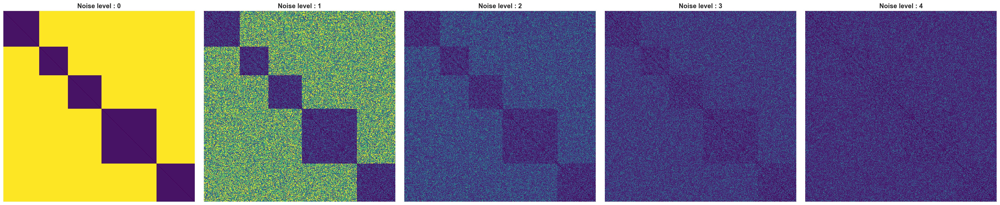

In [83]:

# Quick plot to check 

f,ax=plt.subplots(1,5, figsize=(30,6))
ax = ax.ravel()
sns.heatmap(perf_values,ax=ax[0],  cbar=False, square=True, xticklabels=False, yticklabels=False, cmap='viridis')
ax[0].set_title('Noise level : 0', fontweight='semibold', fontsize=14);
sns.heatmap(noisy_values, ax=ax[1], cbar=False, square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False, cmap='viridis')
ax[1].set_title('Noise level : 1', fontweight='semibold', fontsize=14);
sns.heatmap(noisier_values, ax=ax[2], cbar=False, square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False, cmap='viridis')
ax[2].set_title('Noise level : 2', fontweight='semibold', fontsize=14);
sns.heatmap(noisier_values_2, ax=ax[3], cbar=False, square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False, cmap='viridis')
ax[3].set_title('Noise level : 3', fontweight='semibold', fontsize=14);
sns.heatmap(noisier_values_3, ax=ax[4], square=True, vmax=1, vmin=0, xticklabels=False, cbar=False, yticklabels=False, cmap='viridis')
ax[4].set_title('Noise level : 4', fontweight='semibold', fontsize=14);
f.tight_layout()
f.savefig('../../../writing/VAE_TCR_DRAFT/noisy_matrices.png', dpi=300, bbox_inches='tight')


In [142]:
def introduce_crossreactivity(dm, label_in, label_out, p_in=0.25, p_out=0.5, mean=0.2, std=0.3, clip_min=0.05, clip_max=1):
    dm=dm.copy()
    values = dm.iloc[:len(dm), :len(dm)].values
    dm.reset_index(inplace=True)
    labels = dm['peptide'].values
    indices = dm['index'].values
    raw_idx = dm['raw_index'].values
    idx_label_in = dm.query('peptide==@label_in').index
    if type(label_out)==str:
        idx_label_out = dm.query('peptide==@label_out').index
    elif type(label_out)==list:
        idx_label_out = np.concatenate([np.array(dm.query('peptide==@l').index) for l in label_out])

    idx_label_in = sorted(np.random.choice(idx_label_in, size=int(p_in*len(idx_label_in)), replace=False))
    idx_label_out = sorted(np.random.choice(idx_label_out, size=int(p_in*len(idx_label_out)), replace=False))

    idxs = np.stack([np.repeat(idx_label_in, len(idx_label_out)), np.tile(idx_label_out, len(idx_label_in))], axis=1)
    fig,ax = plt.subplots(1,2, figsize=(12,5))
    values1 = deepcopy(values)
    noise = np.clip(np.random.normal(mean, std, size=len(values[idxs[:,0], idxs[:, 1]])), clip_min, clip_max)
    values[idxs[:,0], idxs[:, 1]] = noise
    values[idxs[:,1], idxs[:, 0]] = noise
    sns.heatmap(values1, ax=ax[0], vmin=0, xticklabels=False, yticklabels=False, square=True, cbar=False)
    sns.heatmap(values, ax=ax[1], vmin=0, xticklabels=False, yticklabels=False, square=True, cbar=False)

    new_dm = pd.DataFrame(values, index=indices, columns=indices)
    new_dm['peptide']=labels
    new_dm['raw_index']=raw_idx
    return new_dm

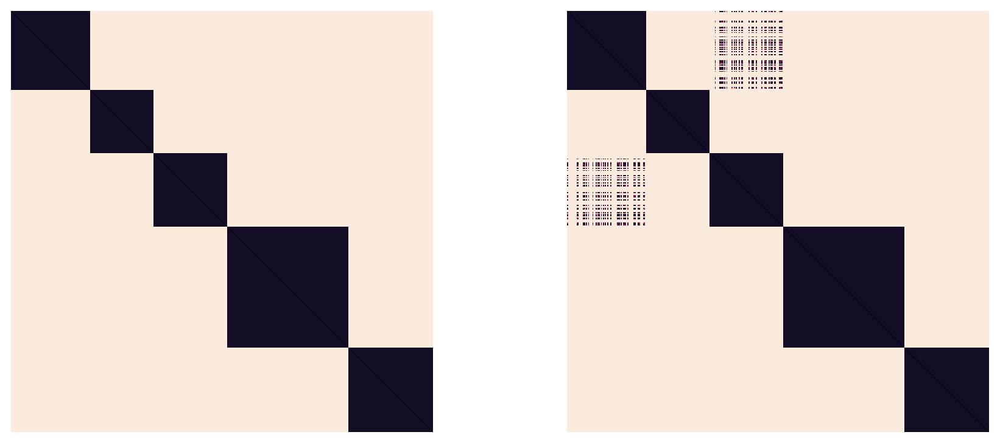

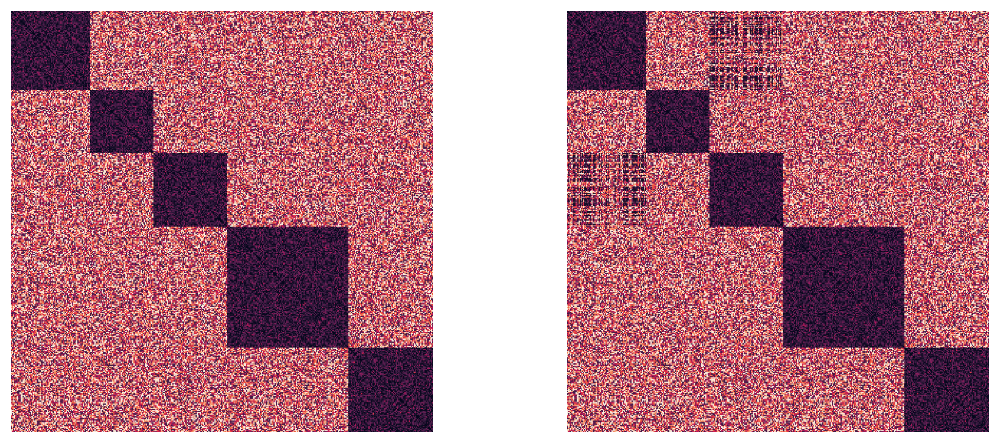

In [123]:
cr_perf_matrix = introduce_crossreactivity(perf_matrix, 'pep_a', ['pep_c', 'pep_e'],
                                           p_in=0.4, p_out=0.667,
                                           mean=0.05, std=0.25, 
                                           clip_min=0.075, clip_max=0.75)
cr_noisy_matrix = introduce_crossreactivity(noisy_matrix, 'pep_a', ['pep_c', 'pep_e'],
                                           p_in=0.5, p_out=0.667,
                                           mean=0.03, std=0.25, 
                                           clip_min=0.055, clip_max=0.75)

In [147]:
noisier_values_3[noisier_values_3!=0].min()

0.0225

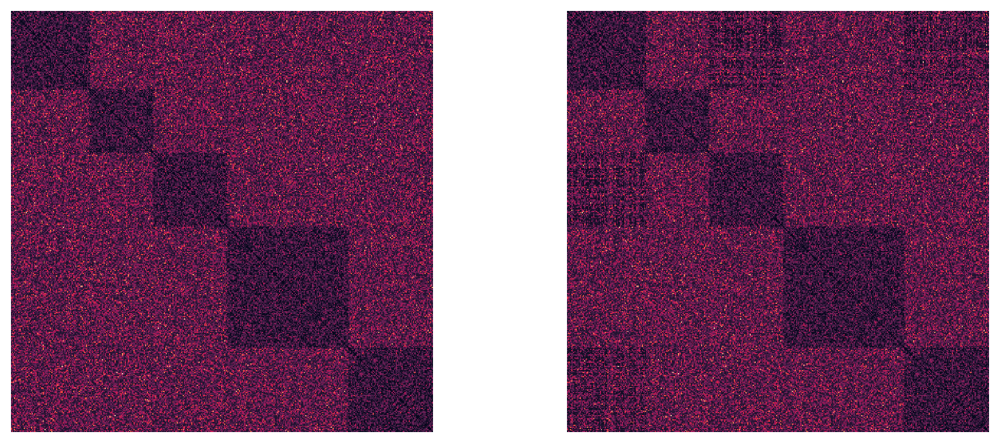

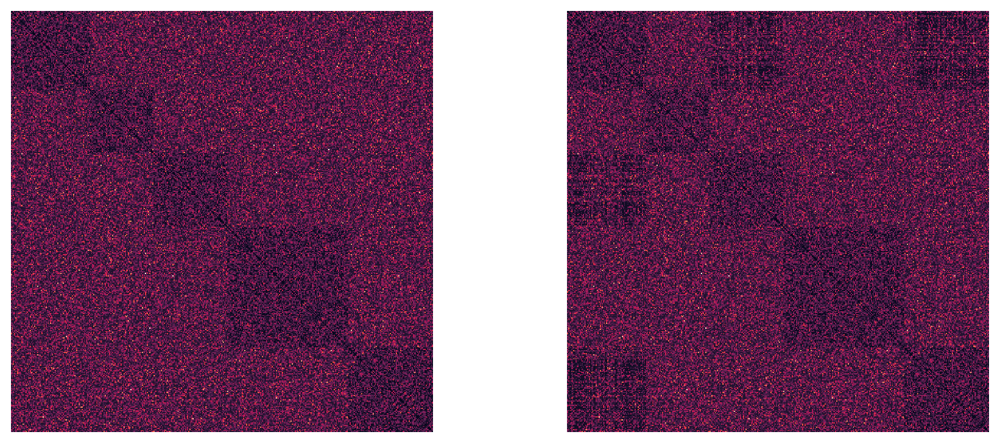

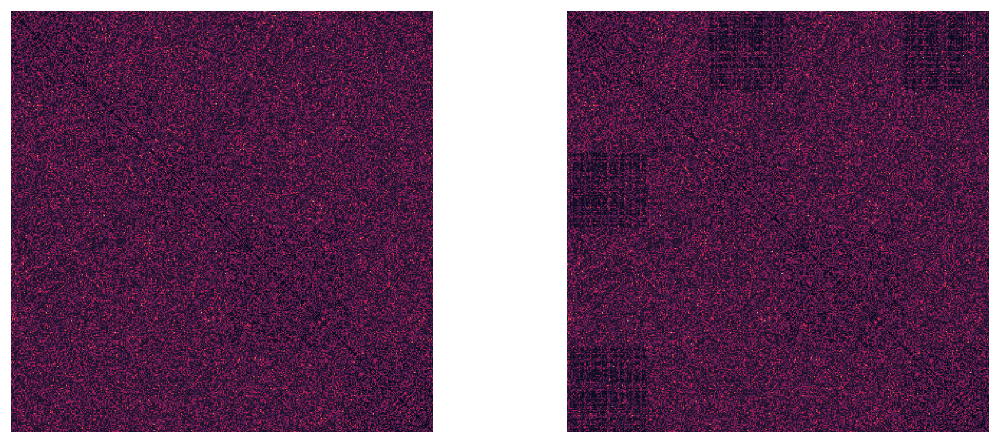

In [148]:
cr_noisier_matrix = introduce_crossreactivity(noisier_matrix, 'pep_a', ['pep_c', 'pep_e'], 
                                           p_in=0.66, p_out=0.667,
                                           mean=0.0275, std=0.3, 
                                           clip_min=0.045, clip_max=0.35)
cr_noisier_2_matrix = introduce_crossreactivity(noisier_2_matrix, 'pep_a', ['pep_c', 'pep_e'], 
                                           p_in=0.66, p_out=0.667,
                                           mean=0.015, std=0.2, 
                                           clip_min=0.035, clip_max=0.35)
cr_noisier_3_matrix = introduce_crossreactivity(noisier_3_matrix, 'pep_a', ['pep_c', 'pep_e'], 
                                           p_in=0.66, p_out=0.667,
                                           mean=0.02, std=0.125, 
                                           clip_min=0.0225, clip_max=0.35)


In [149]:
cr_perf_cut = in_silico_cuts(cr_perf_matrix)
cr_noisy_cut = in_silico_cuts(cr_noisy_matrix)
cr_noisier_cut = in_silico_cuts(cr_noisier_matrix)
cr_noisier_2_cut = in_silico_cuts(cr_noisier_2_matrix)
cr_noisier_3_cut = in_silico_cuts(cr_noisier_3_matrix)

Initial mean purity, silhouette score, retention
0.6404 0.4549 1.0


cuts:   0%|          | 0/397 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.6404 0.369 1.0


cuts:   0%|          | 0/397 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.6404 0.2078 1.0


cuts:   0%|          | 0/397 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.6404 0.1308 1.0


cuts:   0%|          | 0/397 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.6404 0.072 1.0


cuts:   0%|          | 0/397 [00:00<?, ?it/s]

In [150]:
cr_perf_agglo = in_silico_agglo(cr_perf_matrix)
cr_noisy_agglo = in_silico_agglo(cr_noisy_matrix)
cr_noisier_agglo = in_silico_agglo(cr_noisier_matrix)
cr_noisier_2_agglo = in_silico_agglo(cr_noisier_2_matrix)
cr_noisier_3_agglo = in_silico_agglo(cr_noisier_3_matrix)

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

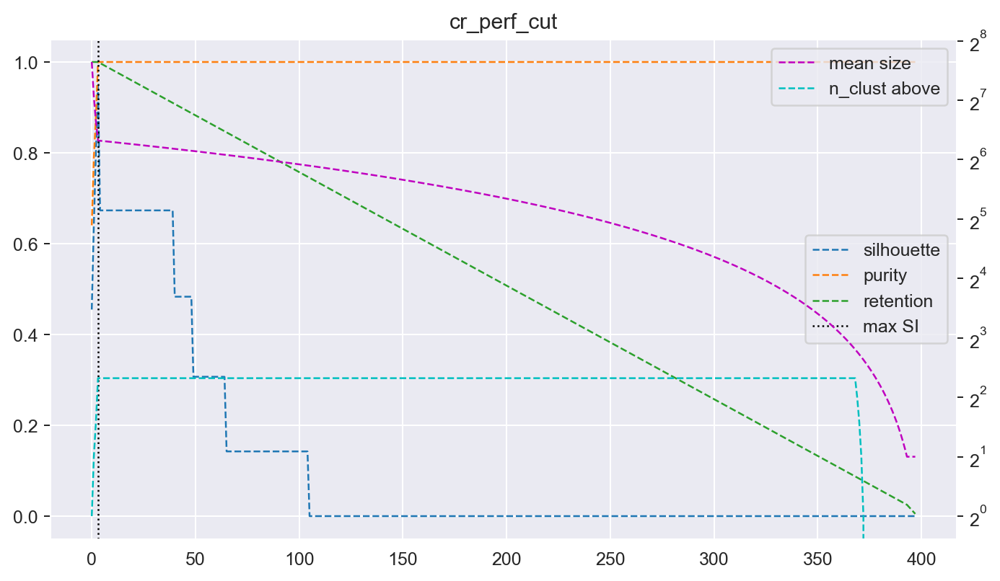

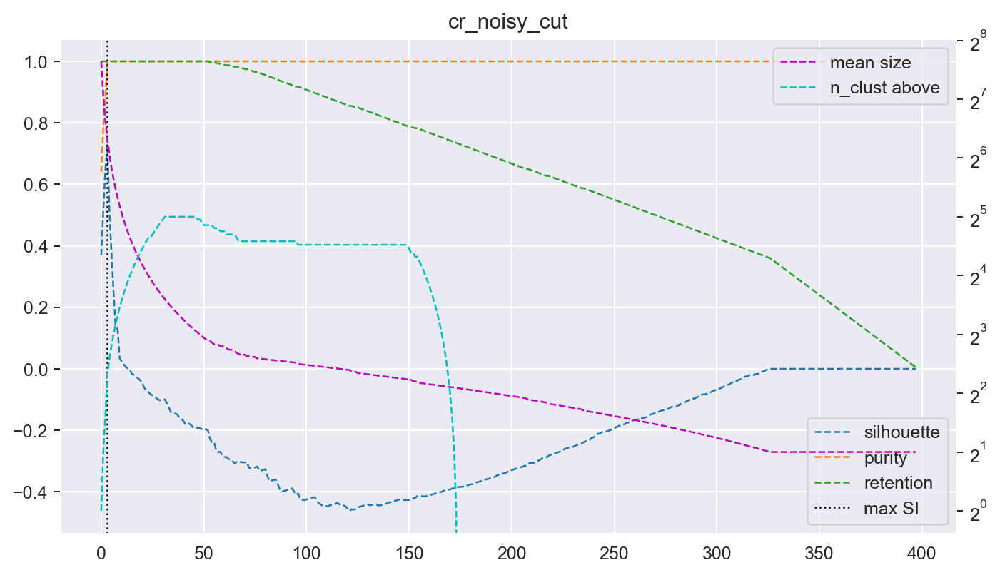

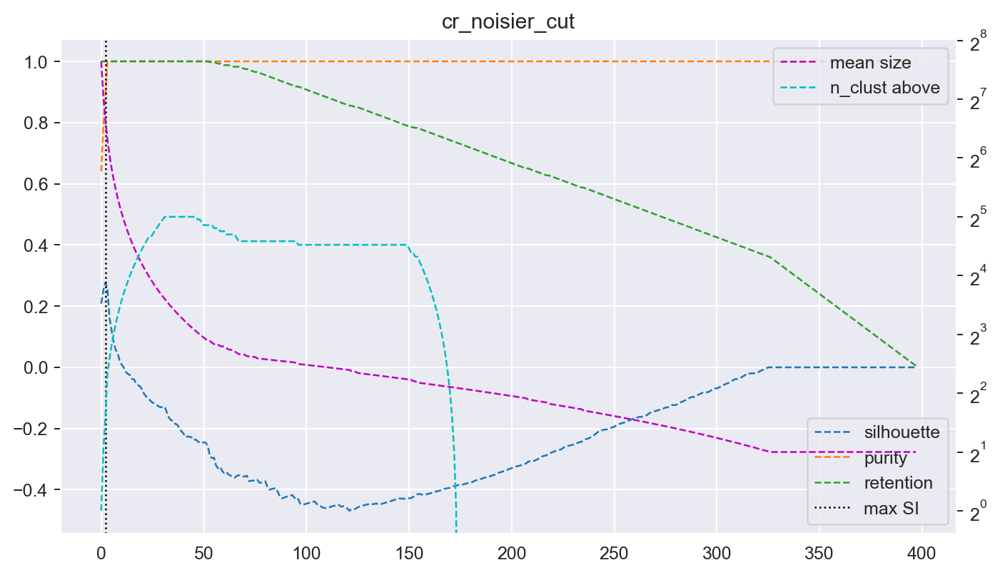

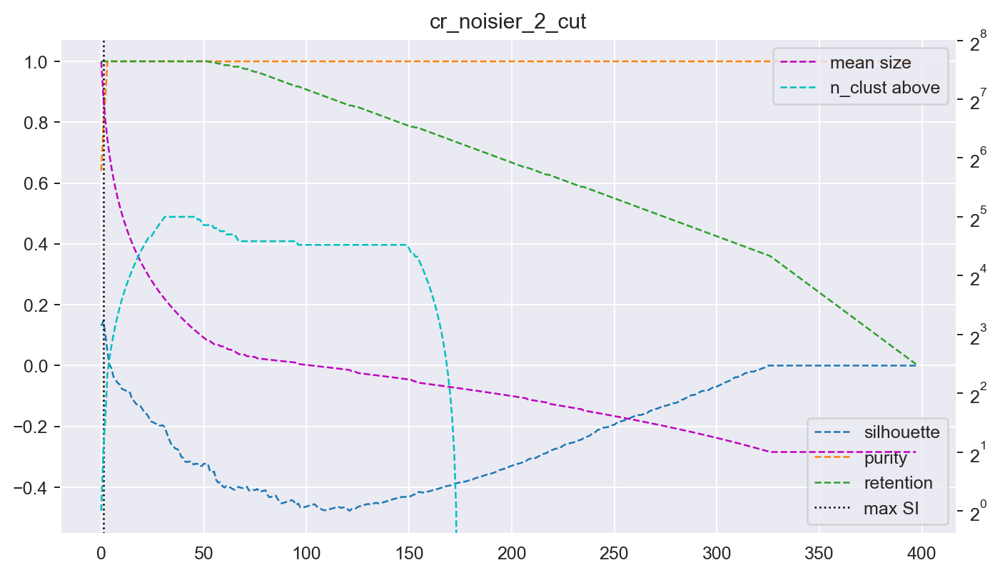

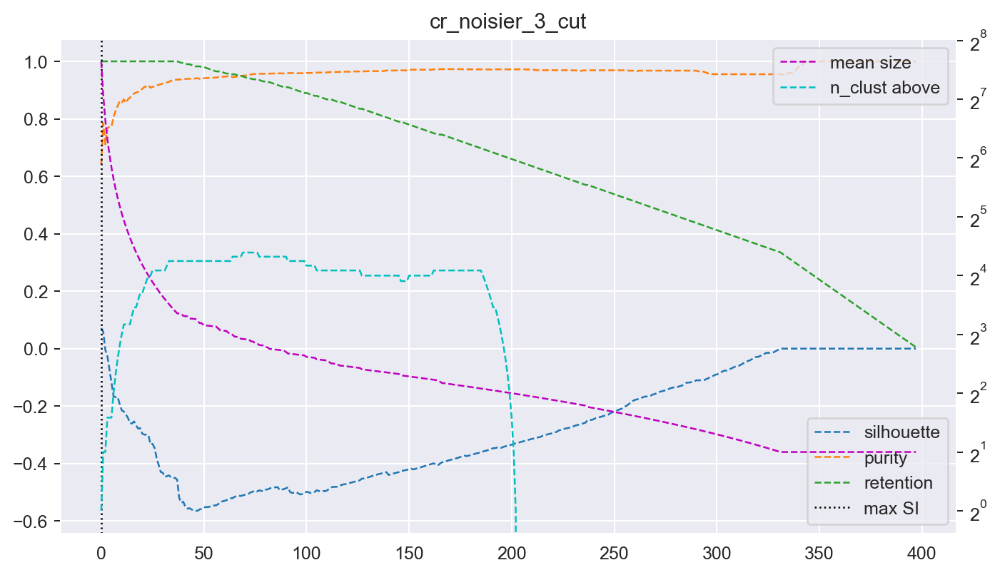

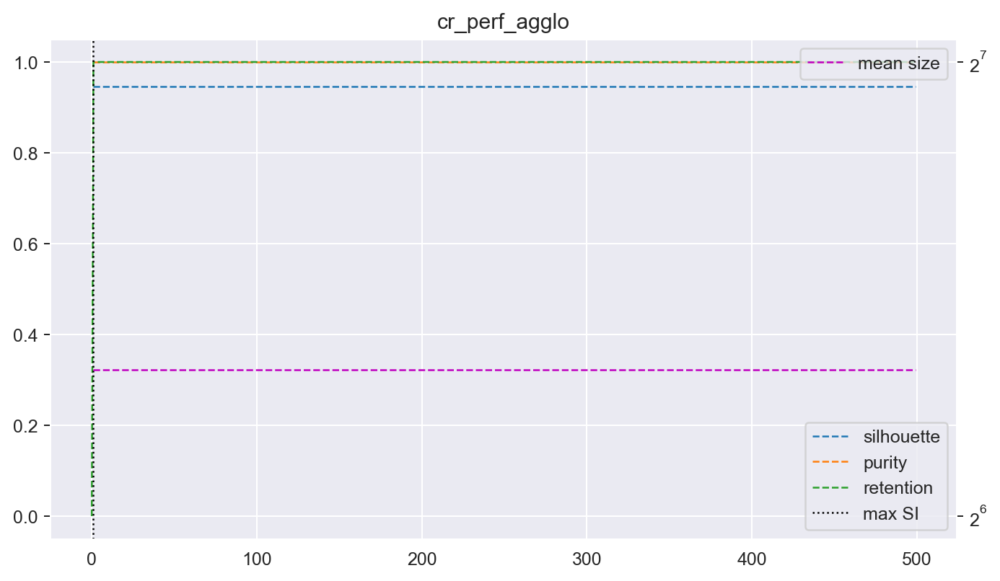

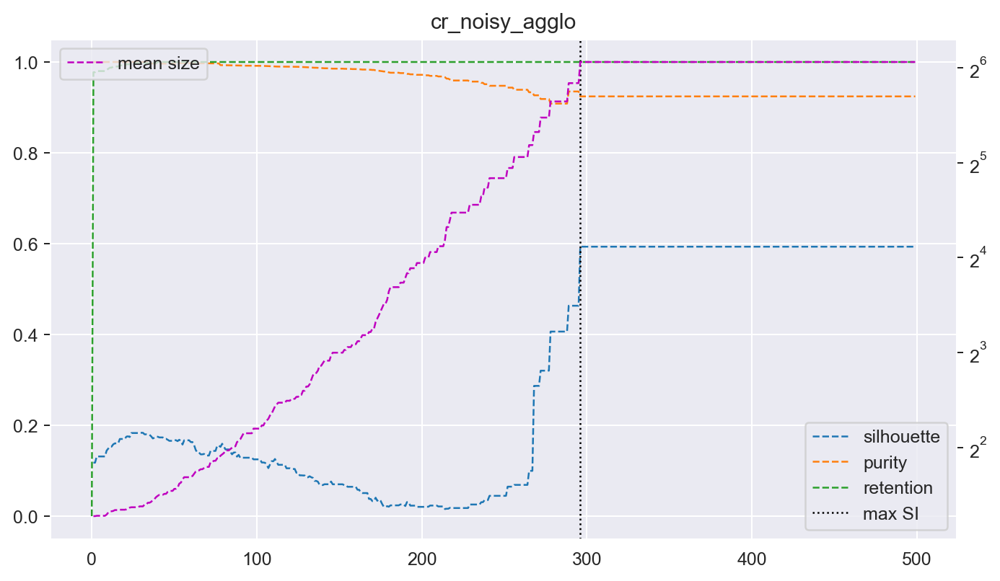

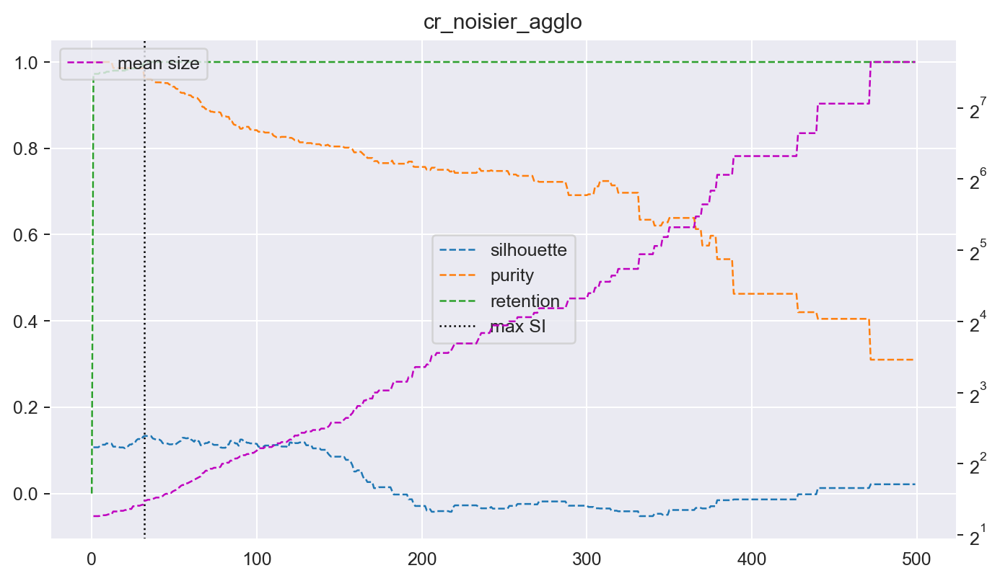

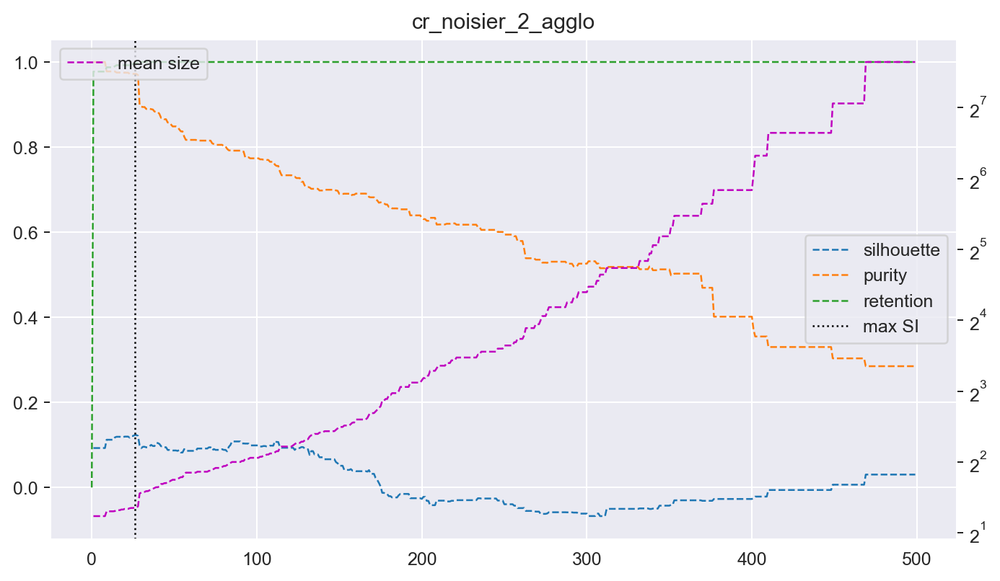

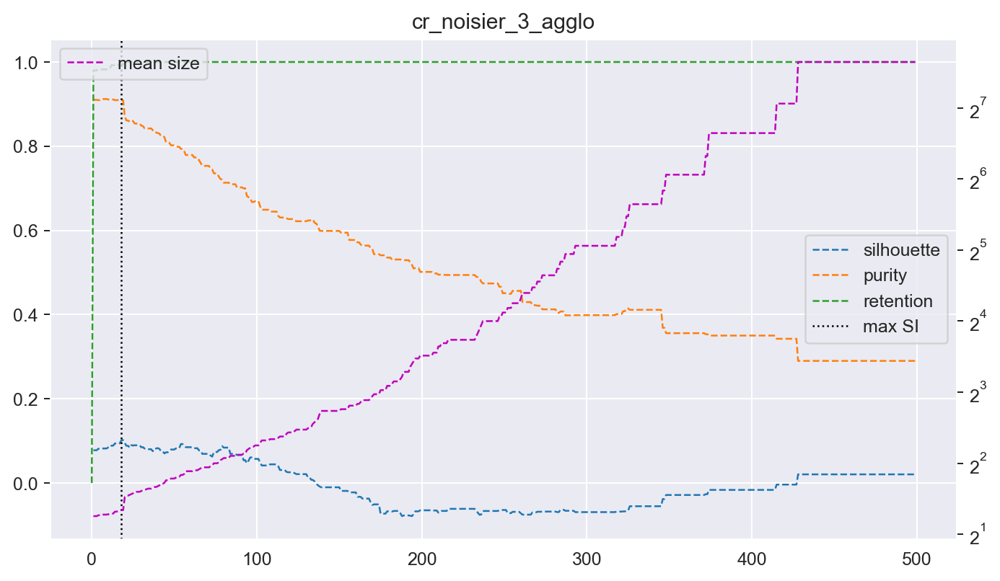

In [151]:
best_cr_perf_cut = plot_sprm(cr_perf_cut[-1], title='cr_perf_cut', burn_in=0)
best_cr_noisy_cut = plot_sprm(cr_noisy_cut[-1], title='cr_noisy_cut', burn_in=0)
best_cr_noisier_cut = plot_sprm(cr_noisier_cut[-1], title='cr_noisier_cut', burn_in=0)
best_cr_noisier_2_cut = plot_sprm(cr_noisier_2_cut[-1], title='cr_noisier_2_cut', burn_in=0)
best_cr_noisier_3_cut = plot_sprm(cr_noisier_3_cut[-1], title='cr_noisier_3_cut', burn_in=0)
best_cr_perf_agglo = plot_sprm(cr_perf_agglo, title='cr_perf_agglo', burn_in=0)
best_cr_noisy_agglo = plot_sprm(cr_noisy_agglo, title='cr_noisy_agglo', burn_in=0)
best_cr_noisier_agglo = plot_sprm(cr_noisier_agglo, title='cr_noisier_agglo', burn_in=0)
best_cr_noisier_2_agglo = plot_sprm(cr_noisier_2_agglo, title='cr_noisier_2_agglo', burn_in=0)
best_cr_noisier_3_agglo = plot_sprm(cr_noisier_3_agglo, title='cr_noisier_3_agglo', burn_in=0)

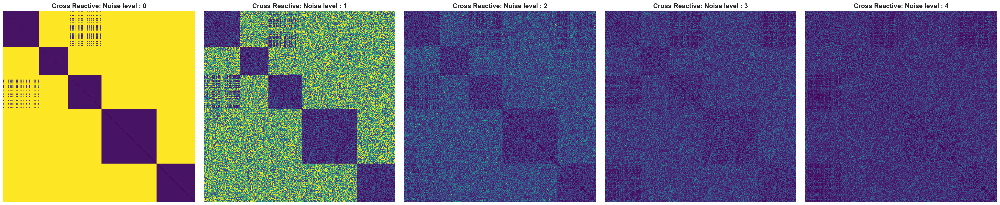

In [294]:

# Quick plot to check 

f,ax=plt.subplots(1,5, figsize=(30,6))
ax = ax.ravel()
sns.heatmap(cr_perf_matrix.iloc[:len(cr_perf_matrix), :len(cr_perf_matrix)].values,ax=ax[0],  cbar=False, square=True, xticklabels=False, yticklabels=False, cmap='viridis')
ax[0].set_title('Cross Reactive: Noise level : 0', fontweight='semibold', fontsize=14);
sns.heatmap(cr_noisy_matrix.iloc[:len(cr_noisy_matrix), :len(cr_noisy_matrix)].values, ax=ax[1], cbar=False, square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False, cmap='viridis')
ax[1].set_title('Cross Reactive: Noise level : 1', fontweight='semibold', fontsize=14);
sns.heatmap(cr_noisier_matrix.iloc[:len(cr_noisier_matrix), :len(cr_noisier_matrix)].values, ax=ax[2], cbar=False, square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False, cmap='viridis')
ax[2].set_title('Cross Reactive: Noise level : 2', fontweight='semibold', fontsize=14);
sns.heatmap(cr_noisier_2_matrix.iloc[:len(cr_noisier_2_matrix), :len(cr_noisier_2_matrix)].values, ax=ax[3], cbar=False, square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False, cmap='viridis')
ax[3].set_title('Cross Reactive: Noise level : 3', fontweight='semibold', fontsize=14);
sns.heatmap(cr_noisier_3_matrix.iloc[:len(cr_noisier_3_matrix), :len(cr_noisier_3_matrix)].values, ax=ax[4], square=True, vmax=1, vmin=0, xticklabels=False, cbar=False, yticklabels=False, cmap='viridis')
ax[4].set_title('Cross Reactive: Noise level : 4', fontweight='semibold', fontsize=14);
f.tight_layout()
f.savefig('../../../writing/VAE_TCR_DRAFT/noisy_crossreactive_matrices.png', dpi=300, bbox_inches='tight')


In [158]:
pd.concat([best_cr_perf_cut.assign(method='cut', matrix='Noise level 0').assign(crossreactive='A and C'),
           best_cr_noisy_cut.assign(method='cut', matrix='Noise level 1').assign(crossreactive='A and C'),
           best_cr_noisier_cut.assign(method='cut', matrix='Noise level 2').assign(crossreactive='A and C,E'),
           best_cr_noisier_2_cut.assign(method='cut', matrix='Noise level 3').assign(crossreactive='A and C,E'),
           best_cr_noisier_3_cut.assign(method='cut', matrix='Noise level 4').assign(crossreactive='A and C,E'),
           best_cr_perf_agglo.assign(method='agglo', matrix='Noise level 0').assign(crossreactive='A and C'),
           best_cr_noisy_agglo.assign(method='agglo', matrix='Noise level 1').assign(crossreactive='A and C'),
           best_cr_noisier_agglo.assign(method='agglo', matrix='Noise level 2').assign(crossreactive='A and C,E'),
           best_cr_noisier_2_agglo.assign(method='agglo', matrix='Noise level 3').assign(crossreactive='A and C,E'),
           best_cr_noisier_3_agglo.assign(method='agglo', matrix='Noise level 4').assign(crossreactive='A and C,E')])\
        [['silhouette','mean_purity','retention','mean_cluster_size','n_cluster','n_above','method','matrix', 'crossreactive']].sort_values('matrix')

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,n_above,method,matrix,crossreactive
3,0.9463,1.000000,1.0000,80.000000,5.0,5.0,cut,Noise level 0,A and C
1,0.9463,1.000000,1.0000,80.000000,5.0,NaN,agglo,Noise level 0,A and C
3,0.7269,1.000000,1.0000,80.000000,5.0,5.0,cut,Noise level 1,A and C
296,0.5933,0.924242,1.0000,66.666667,6.0,NaN,agglo,Noise level 1,A and C
2,0.2763,0.879310,1.0000,100.000000,4.0,3.0,cut,Noise level 2,"A and C,E"
32,0.1335,0.960490,1.0000,2.797203,143.0,NaN,agglo,Noise level 2,"A and C,E"
1,0.1462,0.785185,1.0000,133.333333,3.0,2.0,cut,Noise level 3,"A and C,E"
26,0.1233,0.972115,0.9975,2.557692,156.0,NaN,agglo,Noise level 3,"A and C,E"
0,0.0720,0.640351,1.0000,200.000000,2.0,1.0,cut,Noise level 4,"A and C,E"
18,0.1019,0.909023,0.9950,2.535032,157.0,NaN,agglo,Noise level 4,"A and C,E"


# Rebuild tree after optimal SI

In [159]:
# Take the three pep set-up first, and compare to cleaned tree?
test_df = exp_df.query('partition==1')
# Equal sampling per class
test_3pep = test_df.query('peptide in ["GILGFVFTL", "RAKFKQLL", "YLQPRTFLL"]').groupby('peptide').sample(n=80, random_state=13)
# Peptide sorted
latent_3pep = get_latent_df(ts_cstrp, test_3pep).sort_values('peptide')
# Get dm da etc
dm_3pep, da_3pep, feats_3pep, labels_3pep, encoded_labels_3pep, label_encoder_3pep = get_distances_labels_from_latent(latent_3pep, index_col='raw_index')

dm_tbcr_test = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv').query('partition==1')
dm_tbcr_3pep, da_tbcr_3pep = resort_baseline(dm_tbcr_test, dm_3pep, 'raw_index')
cols=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'matrix', 'method']

           count
peptide         
GILGFVFTL     80
RAKFKQLL      80
YLQPRTFLL     80
           count
peptide         
GILGFVFTL     20
RAKFKQLL      27
YLQPRTFLL     20
           count
peptide         
GILGFVFTL     25
RAKFKQLL      15
YLQPRTFLL     12


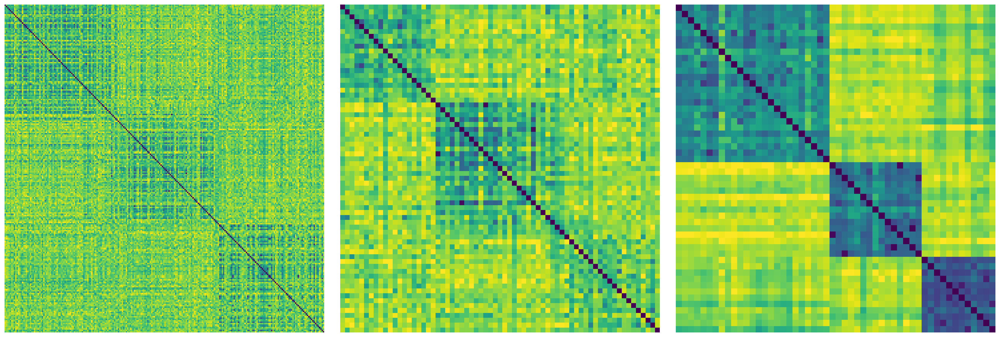

In [161]:
from sklearn.preprocessing import MinMaxScaler
f,ax = plt.subplots(1,3,figsize=(22,7.5))
cleaned_t1 = clean_dm(dm_3pep, 1, 1.)
cleaned_t2 = clean_dm(dm_3pep, .80, .80)
mms = MinMaxScaler()
raw_values = mms.fit_transform(dm_3pep.iloc[:len(dm_3pep), :len(dm_3pep)].values)
t1_values = mms.fit_transform(cleaned_t1.iloc[:len(cleaned_t1), :len(cleaned_t1)].values)
t2_values = mms.fit_transform(cleaned_t2.iloc[:len(cleaned_t2), :len(cleaned_t2)].values)

sns.heatmap(raw_values, ax=ax[0], vmin=0, vmax=1, xticklabels=False, yticklabels=False, cmap='viridis', cbar=False)
sns.heatmap(t1_values, vmin=0, vmax=1, ax=ax[1], xticklabels=False, yticklabels=False, cmap='viridis', cbar=False)
sns.heatmap(t2_values, vmin=0, vmax=1,  ax=ax[2], xticklabels=False, yticklabels=False, cmap='viridis', cbar=False)
print(dm_3pep.groupby('peptide').agg(count=('partition', 'count')))
print(cleaned_t1.groupby('peptide').agg(count=('partition', 'count')))
print(cleaned_t2.groupby('peptide').agg(count=('partition', 'count')))
f.tight_layout(w_pad=2.5)

In [281]:
# Take the 3peps tree, get the optimal SI using normal Top-1W cut
clean_0 = dm_3pep.copy()
clean_1 = cleaned_t1.copy()
clean_2 = cleaned_t2.copy()
# here this is the un-clean version
pep3_clusters_c0, pep3_nodes_c0, pep3_subgraphs_c0, pep3_tree_c0, pep3_labels_c0, pep3_singletons_c0, pep3_cut_df_c0 = in_silico_cuts(clean_0)
# pep3_agglo_df = in_silico_agglo(dm_3pep)
# Here this is the "denoised" version
pep3_clusters_c1, pep3_nodes_c1, pep3_subgraphs_c1, pep3_tree_c1, pep3_labels_c1, pep3_singletons_c1, pep3_cut_df_c1 = in_silico_cuts(clean_1)
# pep3_agglo_df_clean1 = in_silico_agglo(clean_1)

pep3_clusters_c2, pep3_nodes_c2, pep3_subgraphs_c2, pep3_tree_c2, pep3_labels_c2, pep3_singletons_c2, pep3_cut_df_c2 = in_silico_cuts(clean_2)
# pep3_agglo_df_clean2 = in_silico_agglo(clean_2)

Initial mean purity, silhouette score, retention
0.595 0.0622 1.0


cuts:   0%|          | 0/237 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.6014 0.1166 1.0


cuts:   0%|          | 0/64 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.8378 0.3811 1.0


cuts:   0%|          | 0/49 [00:00<?, ?it/s]

In [282]:
G, tree, matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(clean_0, label_col='peptide', index_col='raw_index', algorithm='kruskal')
tree = augment_tree_edges(tree, values, percentile=40)
results_df, best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, all_cluster_sizes, clusters_above = twophase_cuts(tree, values, 0.2)


0.43694702386856077


Phase 1 : Betweenness cuts:   0%|          | 0/84 [00:00<?, ?it/s]

Phase 2 : Silhouette trims:   0%|          | 0/336 [00:00<?, ?it/s]

In [289]:
print('top1\n', pep3_cut_df_c0.loc[pep3_cut_df_c0['silhouette'].idxmax()])
print('phase\n', results_df.loc[results_df['silhouette'].idxmax()])

top1
 silhouette            0.150300
mean_purity           0.869478
retention             0.787500
mean_cluster_size     2.277108
n_cluster            83.000000
n_above               0.000000
Name: 132, dtype: float64
phase
 silhouette                  0.1233
mean_purity               0.832486
retention                   0.8625
mean_cluster_size         3.508475
n_cluster                     59.0
n_above                        4.0
silhouette_aggregation       micro
best                          True
Name: 104, dtype: object


In [188]:
phase_nodes = list(best_tree.nodes())
subset_phase = clean_0.iloc[phase_nodes, phase_nodes]
subset_phase = subset_phase.merge(clean_0[[x for x in clean_0.columns if x in [x for x in clean_0.columns if x not in clean_0.index]]], 
                      left_index=True, right_index=True, how='left')

In [177]:
# First check the heatmap of the remaining nodes from the top SI top1w cut
remaining_nodes = list(pep3_tree_c0.nodes())
subset = clean_0.iloc[remaining_nodes, remaining_nodes]
subset = subset.merge(clean_0[[x for x in clean_0.columns if x in [x for x in clean_0.columns if x not in clean_0.index]]], 
                      left_index=True, right_index=True, how='left')

In [208]:
def phase_aug_wrapper(dm, percentile=40, phase=0.2, label_col='peptide', index_col='raw_index'):
    G, tree, matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm, label_col, index_col, algorithm='kruskal')
    tree_aug = augment_tree_edges(tree, values, percentile=percentile)
    results_df, best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, all_cluster_sizes, clusters_above = twophase_cuts(tree_aug, values, phase)
    return results_df, best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, all_cluster_sizes, clusters_above

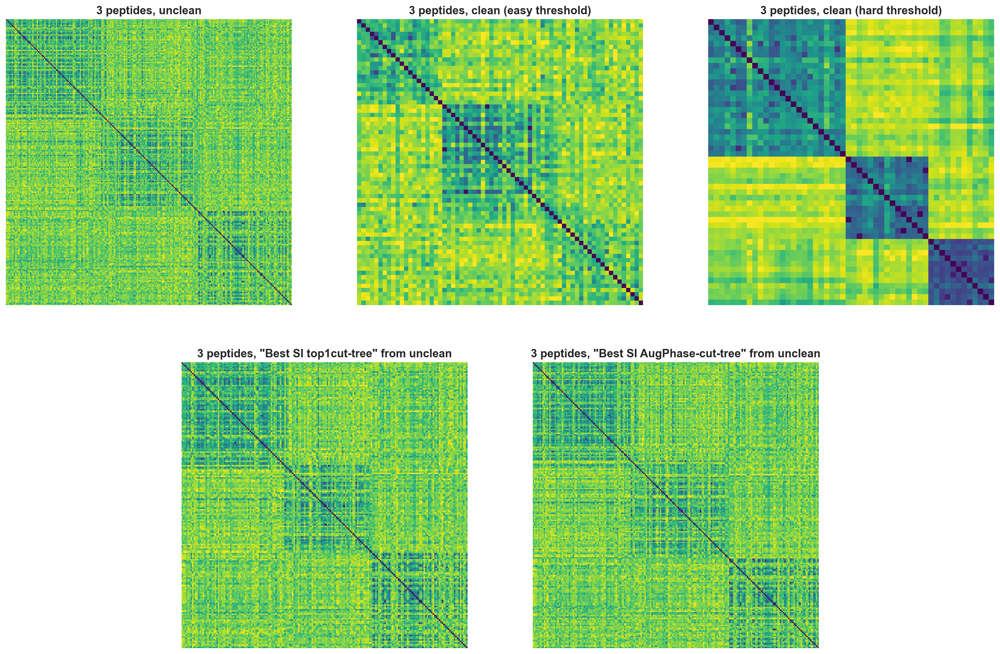

In [200]:
# Check heat-map
from sklearn.preprocessing import MinMaxScaler
# Create a figure with a suitable aspect ratio to maintain square subplots
fig = plt.figure(figsize=(22, 14))

# Set up a grid with 3 columns. First row has 3 plots, second row has only 2 (centered).
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 1])

# First row: 3 square plots
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])

# Second row: 2 centered square plots by spanning columns to create square proportions
ax3 = fig.add_subplot(gs[1, 0:2])
ax4 = fig.add_subplot(gs[1, 1:3])

# Set aspect ratio to 'equal' to ensure square plots
for ax in [ax1, ax2, ax3, ax4, ax5]:
    ax.set_aspect('equal')


cleaned_t1 = clean_dm(dm_3pep, 1, 1.)
cleaned_t2 = clean_dm(dm_3pep, .80, .80)
mms = MinMaxScaler()
raw_values = mms.fit_transform(dm_3pep.iloc[:len(dm_3pep), :len(dm_3pep)].values)
t1_values = mms.fit_transform(cleaned_t1.iloc[:len(cleaned_t1), :len(cleaned_t1)].values)
t2_values = mms.fit_transform(cleaned_t2.iloc[:len(cleaned_t2), :len(cleaned_t2)].values)
subset_values = mms.fit_transform(subset.iloc[:len(subset), :len(subset)].values)
phase_values = mms.fit_transform(subset_phase.iloc[:len(subset_phase), :len(subset_phase)].values)
sns.heatmap(raw_values, vmin=0, vmax=1, ax=ax0, xticklabels=False, yticklabels=False, cmap='viridis', cbar=False, square=True)
sns.heatmap(t1_values, vmin=0, vmax=1, ax=ax1, xticklabels=False, yticklabels=False, cmap='viridis', cbar=False, square=True)
sns.heatmap(t2_values, vmin=0, vmax=1,  ax=ax2, xticklabels=False, yticklabels=False, cmap='viridis', cbar=False, square=True)
sns.heatmap(subset_values, vmin=0, vmax=1, ax=ax3, xticklabels=False, yticklabels=False, cmap='viridis', cbar=False, square=True)
sns.heatmap(phase_values, vmin=0, vmax=1, ax=ax4, xticklabels=False, yticklabels=False, cmap='viridis', cbar=False, square=True)
ax0.set_title('3 peptides, unclean', fontsize=14, fontweight='semibold')
ax1.set_title('3 peptides, clean (easy threshold)', fontsize=14, fontweight='semibold')
ax2.set_title('3 peptides, clean (hard threshold)', fontsize=14, fontweight='semibold')
ax3.set_title('3 peptides, "Best SI top1cut-tree" from unclean', fontsize=14, fontweight='semibold')
ax4.set_title('3 peptides, "Best SI AugPhase-cut-tree" from unclean', fontsize=14, fontweight='semibold')
f.tight_layout(h_pad=0.8, w_pad=0.8)

In [249]:
import pandas as pd
import numpy as np
import networkx as nx
from scipy.sparse import csr_matrix

def create_filtered_mst(df, node_list, exclude_value=-1, label_col='peptide', index_col='raw_index', weight_col=None):
    """
    Filters a distance matrix to keep only edges within node_list, constructs a sparse matrix,
    and creates an MST, adding back missing nodes as isolated components.
    
    Args:
        df (pd.DataFrame): A square DataFrame where distances are represented with numeric values,
                           and other columns may include metadata.
        node_list (list): List of nodes for which we keep all-against-all edges.
        exclude_value (int or float): The value used to indicate missing edges.
        
    Returns:
        mst (networkx.Graph): The MST with disconnected nodes included as isolated nodes.
    """
    # Step 1: Filter the distance matrix by setting non-node_list pairs to `exclude_value`
    n = df.shape[0]
    distance_matrix = df.iloc[:len(df), :len(df)].values.copy()
    
    # Create a mask for the all-against-all pairs in `node_list`
    mask = np.zeros((n, n), dtype=bool)
    mask[np.ix_(node_list, node_list)] = True
    
    # Set values outside the mask to exclude_value
    distance_matrix[~mask] = exclude_value

    # Step 2: Create a sparse matrix, ignoring `exclude_value` entries
    sparse_matrix = csr_matrix(np.where(distance_matrix != exclude_value, distance_matrix, 0))

    # Step 3: Create the graph and MST
    G = nx.from_scipy_sparse_array(sparse_matrix, edge_attribute='weight')
    df = df.copy(deep=True)
    indexing = [str(x) for x in df.index] if type(
        df.columns[0]) == str else df.index
    values = df[indexing].values
    labels = df[label_col].values
    if index_col is not None:
        # print(f'here in create_mst_from_distance_matrix, index_col is not None, using {index_col}')
        raw_indices = df[index_col].values
    else:
        print(f'Here in create_mst_from_distance_matrix, index_col is None. Will create and use {"raw_index"} instead')
        index_col = 'raw_index'
        df[index_col] = [f'seqid_{i}' for i in range(len(df))]
        raw_indices = df[index_col].values
    
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(labels)
    if weight_col is not None and weight_col in df.columns:
        weights = df[weight_col].values

    # Creating the graph and storing data in nodes
    for i, node in enumerate(G.nodes()):
        G.nodes[node]['label'] = labels[i]
        G.nodes[node]['index'] = raw_indices[i]
        if weight_col is not None and weight_col in df.columns:
            G.nodes[node]['weight'] = weights[i]

    mst = nx.minimum_spanning_tree(G)
    
    # Step 4: Add isolated nodes that were not in `node_list`
    all_nodes = set(range(n))
    missing_nodes = all_nodes - set(node_list)
    mst.add_nodes_from(missing_nodes)  # Add missing nodes as isolated components

    return mst, sparse_matrix

def filter_phase_aug_wrapper(dm, node_list, percentile=40, phase=0.2, label_col='peptide', index_col='raw_index'):
    tree, sparse_matrix = create_filtered_mst(dm, node_list)
    tree_aug = augment_tree_edges_sparse(tree, sparse_matrix, percentile=percentile)
    results_df, best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, all_cluster_sizes, clusters_above = twophase_cuts(tree_aug, sparse_matrix, phase)
    # do it like this just so I can ?? my function and see what it returns
    return results_df, best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, all_cluster_sizes, clusters_above

def filter_top1_wrapper(dm, node_list, label_col='peptide', index_col='raw_index'):
    tree, sparse_matrix = create_filtered_mst(dm, node_list)
    best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_micro, c_above \
        = iterative_topn_cut_logsize(sparse_matrix, tree, initial_cut_threshold=1, initial_cut_method='top',
                                     cut_threshold=1, which='edge', distance_weighted=True, verbose=0, score_threshold=1, silhouette_aggregation='micro')
    n_above = [len(x) for x in c_above]
    micro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters, n_above]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'n_above'])
    # do it like this just so I can ?? my function and see what it returns
    return  micro_cut_df, best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed 


In [272]:
# Rebuild tree from subsets and re-do cuts (?)
pep3_clusters_subset, pep3_nodes_subset, pep3_subgraphs_subset, pep3_tree_subset, pep3_labels_subset, pep3_singletons_subset, pep3_cut_df_subset = in_silico_cuts(subset)
pep3_clusters_phase, pep3_nodes_phase, pep3_subgraphs_phase, pep3_tree_phase, pep3_labels_phase, pep3_singletons_phase, pep3_cut_df_phase = in_silico_cuts(subset_phase)
# Redo phase cuts
recut_subset_phasecut_df, recut_subset_tree, _, _ ,_ ,_ ,_ ,_  = phase_aug_wrapper(subset)
recut_phase_phasecut_df, recut_phase_tree, _, _ ,_ ,_ ,_ ,_  = phase_aug_wrapper(subset_phase)

Initial mean purity, silhouette score, retention
0.5713 0.0951 1.0


cuts:   0%|          | 0/186 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.5565 0.0904 1.0


cuts:   0%|          | 0/204 [00:00<?, ?it/s]

0.42050167322158816


Phase 1 : Betweenness cuts:   0%|          | 0/64 [00:00<?, ?it/s]

Phase 2 : Silhouette trims:   0%|          | 0/259 [00:00<?, ?it/s]

0.4230648875236511


Phase 1 : Betweenness cuts:   0%|          | 0/72 [00:00<?, ?it/s]

Phase 2 : Silhouette trims:   0%|          | 0/287 [00:00<?, ?it/s]

In [ ]:
# adjust the retention : 
# 1.0 = 1.0 of whatever was left in the other graph, divided by the actual total number (len(dist_array))

In [290]:
retention_phase = len(subset_phase) / len(clean_0)
retention_top1 = len(subset) / len(clean_0)
pep3_cut_df_subset['retention'] = pep3_cut_df_subset['retention']*retention_top1
pep3_cut_df_phase['retention'] = pep3_cut_df_phase['retention']*retention_phase
recut_subset_phasecut_df['retention'] = recut_subset_phasecut_df['retention']*retention_top1
recut_phase_phasecut_df['retention'] = recut_phase_phasecut_df['retention']*retention_phase
retention_phase, retention_top1

(0.8625, 0.7875)

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,n_above,silhouette_aggregation,best
72,0.1738,0.838624,0.845854,3.222222,63.0,4.0,micro,True


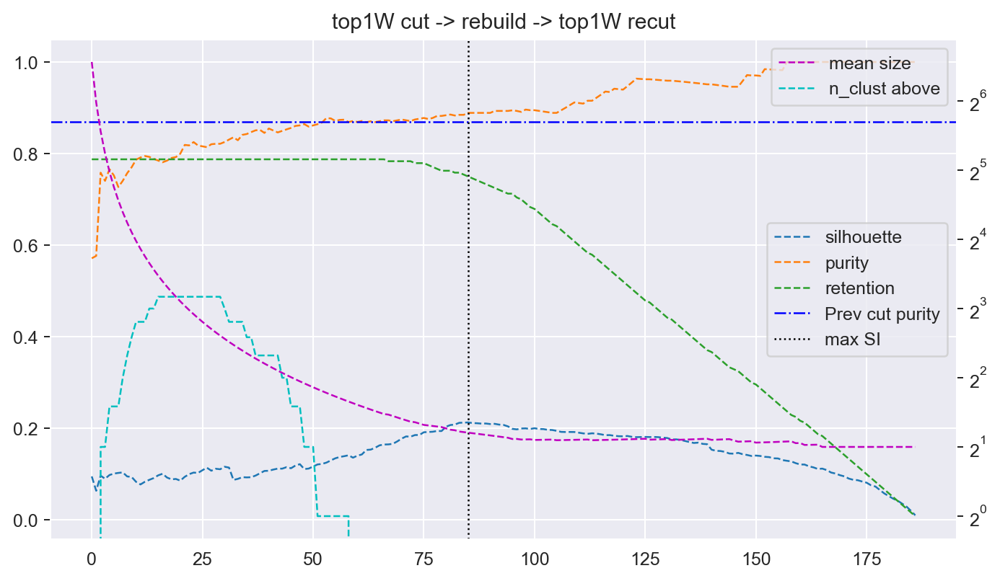

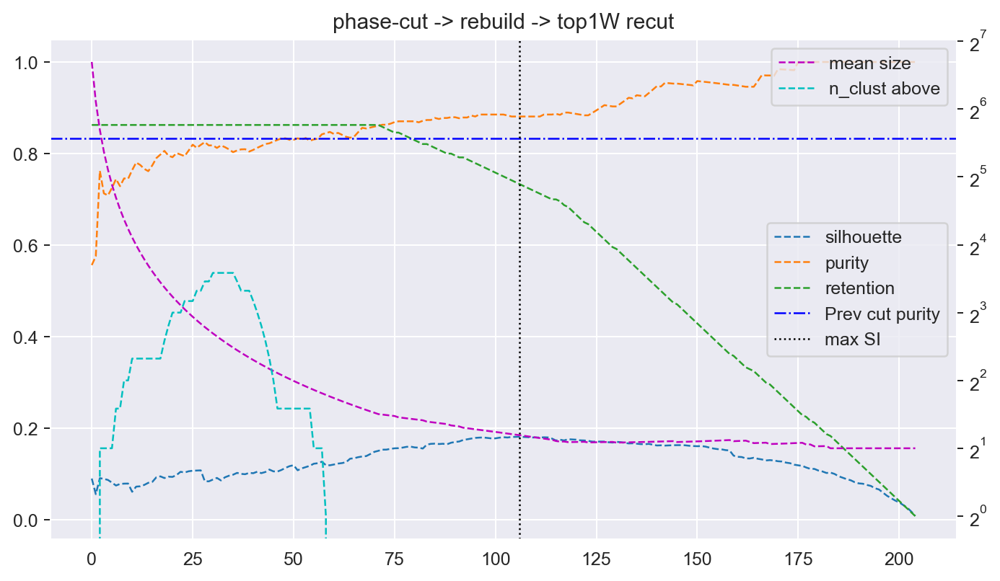

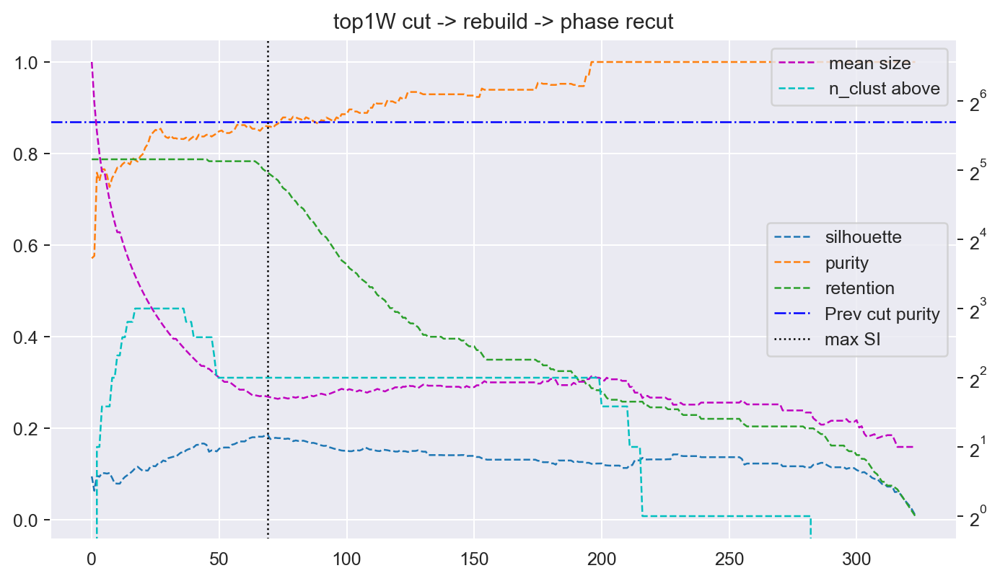

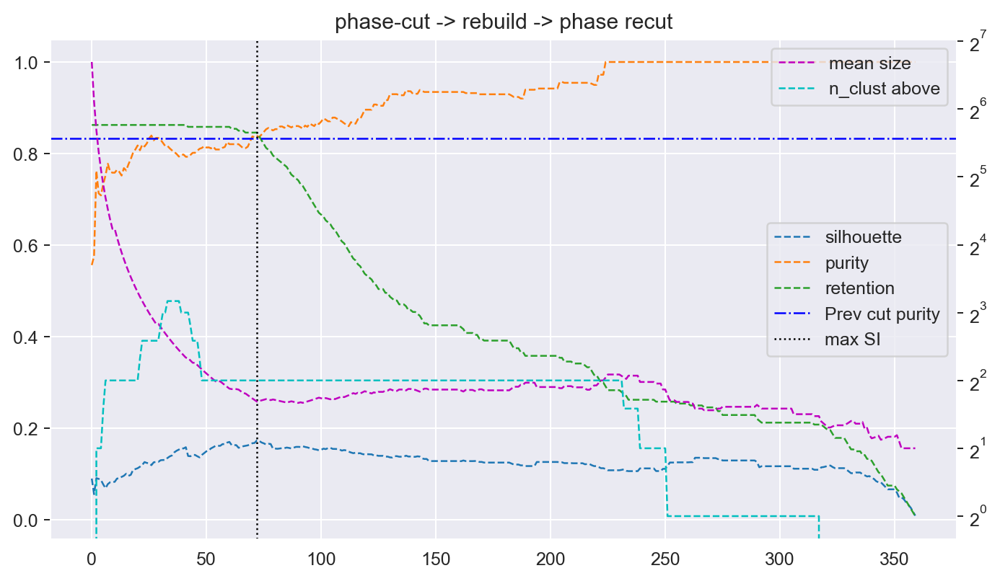

In [293]:
# Need to include the other nodes to have the "true" retention
pur_top1 = pep3_cut_df_c0.loc[pep3_cut_df_c0['silhouette'].idxmax(), 'mean_purity'].item()
pur_phase = results_df.loc[results_df['silhouette'].idxmax(), 'mean_purity'].item()
plot_sprm(pep3_cut_df_subset, 'top1W cut -> rebuild -> top1W recut', hline=pur_top1, hline_label='Prev cut purity')
plot_sprm(pep3_cut_df_phase, title='phase-cut -> rebuild -> top1W recut', hline=pur_phase, hline_label='Prev cut purity')
plot_sprm(recut_subset_phasecut_df, 'top1W cut -> rebuild -> phase recut', hline=pur_top1, hline_label='Prev cut purity')
plot_sprm(recut_phase_phasecut_df, title='phase-cut -> rebuild -> phase recut', hline=pur_phase, hline_label='Prev cut purity')